In [1]:
!pip install ultralytics opencv-python tqdm matplotlib -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 26.6 MB/s eta 0:00:00


In [2]:
import os
import shutil
import yaml
import time
import random
from glob import glob
from tqdm import tqdm

import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
!wget https://github.com/pvateekul/digitalhealth-ai2025/raw/main/dataset/Kvasir.zip
!unzip -q -o 'Kvasir.zip'

--2025-12-16 16:26:26--  https://github.com/pvateekul/digitalhealth-ai2025/raw/main/dataset/Kvasir.zip
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/pvateekul/digitalhealth-ai2025/main/dataset/Kvasir.zip [following]
--2025-12-16 16:26:26--  https://media.githubusercontent.com/media/pvateekul/digitalhealth-ai2025/main/dataset/Kvasir.zip
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.108.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 77444639 (74M) [application/zip]
Saving to: ‘Kvasir.zip’

Kvasir.zip          100%[===================>]  73.86M  42.0MB/s    in 1.8s    

2025-12-16 16:26:29 (42.0 MB/s) - ‘Kvasir.zip’ saved [77444

In [4]:
base_root = "./"
dataset_root = os.path.join(base_root, "Kvasir-SEG", "Kvasir-SEG")

img_dir = os.path.join(dataset_root, "images")
mask_dir = os.path.join(dataset_root, "masks")

train_txt = os.path.join(base_root, "train.txt")
val_txt = os.path.join(base_root, "val.txt")

os.makedirs("dataset/images/train", exist_ok=True)
os.makedirs("dataset/images/val", exist_ok=True)
os.makedirs("dataset/labels/train", exist_ok=True)
os.makedirs("dataset/labels/val", exist_ok=True)

In [5]:
# Convert mask -> YOLO segmentation labels
def mask_to_yolo(mask_path, save_path):
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        return
    mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)[1]
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    h, w = mask.shape
    lines = []
    for cnt in contours:
        if len(cnt) < 3:
            continue
        cnt = cnt.reshape(-1, 2)
        norm = []
        for x, y in cnt:
            norm.append(f"{x/w:.6f} {y/h:.6f}")
        line = f"0 " + " ".join(norm)
        lines.append(line)
    with open(save_path, "w") as f:
        f.write("\n".join(lines))

In [6]:
def prepare_split(txt_file, split):
    with open(txt_file, "r") as f:
        ids = [line.strip() for line in f.readlines() if line.strip()]
    for img_id in tqdm(ids, desc=f"Processing {split}"):

        found_img = None
        for ext in [".jpg", ".png", ".jpeg", ".bmp"]:
            candidate = os.path.join(img_dir, img_id + ext)
            if os.path.exists(candidate):
                found_img = candidate
                break

        if found_img is None:
            print(f"error: {img_id}")
            continue

        found_mask = None
        for ext in [".jpg", ".png", ".jpeg", ".bmp"]:
            candidate_mask = os.path.join(mask_dir, img_id + ext)
            if os.path.exists(candidate_mask):
                found_mask = candidate_mask
                break

        if found_mask is None:
            print(f"⚠️ Bỏ qua: {img_id} (không tìm thấy mask)")
            continue

        img_name = os.path.basename(found_img)
        shutil.copy(found_img, f"dataset/images/{split}/{img_name}")
        yolo_label_path = f"dataset/labels/{split}/{img_id}.txt"
        mask_to_yolo(found_mask, yolo_label_path)

prepare_split(train_txt, "train")
prepare_split(val_txt, "val")

Processing val: 100%|██████████| 100/100 [00:00<00:00, 353.18it/s]


In [7]:
data_yaml = {
    "train": os.path.abspath("dataset/images/train"),
    "val": os.path.abspath("dataset/images/val"),
    "nc": 1,
    "names": ["polyp"]
}
with open("kvasir.yaml", "w") as f:
    yaml.dump(data_yaml, f, default_flow_style=False)
print(open("kvasir.yaml").read())

names:
- polyp
nc: 1
train: /content/dataset/images/train
val: /content/dataset/images/val



In [8]:
yolov12_seg_yaml = '''
nc: 1 # number of classes
scales: # model compound scaling constants, i.e. 'model=yolo12n-seg.yaml' will call yolo12-seg.yaml with scale 'n'
  # [depth, width, max_channels]
  n: [0.50, 0.25, 1024] # summary: 294 layers, 2,855,056 parameters, 2,855,040 gradients, 10.6 GFLOPs
  s: [0.50, 0.50, 1024] # summary: 294 layers, 9,938,592 parameters, 9,938,576 gradients, 35.7 GFLOPs
  m: [0.50, 1.00, 512] # summary: 314 layers, 22,505,376 parameters, 22,505,360 gradients, 123.5 GFLOPs
  l: [1.00, 1.00, 512] # summary: 510 layers, 28,756,992 parameters, 28,756,976 gradients, 145.1 GFLOPs
  x: [1.00, 1.50, 512] # summary: 510 layers, 64,387,264 parameters, 64,387,248 gradients, 324.6 GFLOPs

# YOLO12n backbone
backbone:
  # [from, repeats, module, args]
  - [-1, 1, Conv, [64, 3, 2]] # 0-P1/2
  - [-1, 1, Conv, [128, 3, 2]] # 1-P2/4
  - [-1, 2, C3k2, [256, False, 0.25]]
  - [-1, 1, Conv, [256, 3, 2]] # 3-P3/8
  - [-1, 2, C3k2, [512, False, 0.25]]
  - [-1, 1, Conv, [512, 3, 2]] # 5-P4/16
  - [-1, 4, A2C2f, [512, True, 4]]
  - [-1, 1, Conv, [1024, 3, 2]] # 7-P5/32
  - [-1, 4, A2C2f, [1024, True, 1]] # 8

# YOLO12n head
head:
  - [-1, 1, nn.Upsample, [None, 2, "nearest"]]
  - [[-1, 6], 1, Concat, [1]] # cat backbone P4
  - [-1, 2, A2C2f, [512, False, -1]] # 11

  - [-1, 1, nn.Upsample, [None, 2, "nearest"]]
  - [[-1, 4], 1, Concat, [1]] # cat backbone P3
  - [-1, 2, A2C2f, [256, False, -1]] # 14

  - [-1, 1, Conv, [256, 3, 2]]
  - [[-1, 11], 1, Concat, [1]] # cat head P4
  - [-1, 2, A2C2f, [512, False, -1]] # 17

  - [-1, 1, Conv, [512, 3, 2]]
  - [[-1, 8], 1, Concat, [1]] # cat head P5
  - [-1, 2, C3k2, [1024, True]] # 20 (P5/32-large)

  - [[14, 17, 20], 1, Segment, [nc, 32, 256]] # Detect(P3, P4, P5)
'''

with open("yolov12_seg.yaml", "w") as f:
    f.write(yolov12_seg_yaml)

In [ ]:
yolov8n_seg_yaml = '''
# YOLOv8n-seg model
# number of classes
nc: 1

# input channels
ch: 3

# YOLOv8n backbone
backbone:
  - [-1, 1, Conv, [32, 3, 2]]      # 0-P1/2
  - [-1, 1, Conv, [64, 3, 2]]      # 1-P2/4
  - [-1, 2, C2f, [64, True]]
  - [-1, 1, Conv, [128, 3, 2]]     # 3-P3/8
  - [-1, 6, C2f, [128, True]]
  - [-1, 1, Conv, [256, 3, 2]]     # 5-P4/16
  - [-1, 6, C2f, [256, True]]
  - [-1, 1, Conv, [512, 3, 2]]     # 7-P5/32
  - [-1, 2, C2f, [512, True]]
  - [-1, 1, SPPF, [512, 5]]

# YOLOv8n head
head:
  - [-1, 1, nn.Upsample, [None, 2, "nearest"]]
  - [[-1, 6], 1, Concat, [1]]
  - [-1, 2, C2f, [256, False]]

  - [-1, 1, nn.Upsample, [None, 2, "nearest"]]
  - [[-1, 4], 1, Concat, [1]]
  - [-1, 2, C2f, [128, False]]

  - [-1, 1, Conv, [128, 3, 2]]
  - [[-1, 11], 1, Concat, [1]]
  - [-1, 2, C2f, [256, False]]

  - [-1, 1, Conv, [256, 3, 2]]
  - [[-1, 9], 1, Concat, [1]]
  - [-1, 2, C2f, [512, False]]

  # segmentation head
  - [[14, 17, 20], 1, Segment, [nc, 32, 256]]
'''
with open("yolov8n_seg.yaml", "w") as f:
    f.write(yolov8n_seg_yaml)


In [9]:
model = YOLO("yolov12n_seg.yaml")

In [10]:
model.train(
    data="kvasir.yaml",
    epochs=100,
    imgsz=640,
    batch=8,
    name="yolo_kvasir_seg",
    workers=2
)

Ultralytics 8.3.239 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=kvasir.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov12n_seg.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_kvasir_seg, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=1

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7abc26160c20>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041, 


0: 640x640 1 polyp, 12.7ms
1: 640x640 1 polyp, 12.7ms
2: 640x640 (no detections), 12.7ms
3: 640x640 1 polyp, 12.7ms
4: 640x640 2 polyps, 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


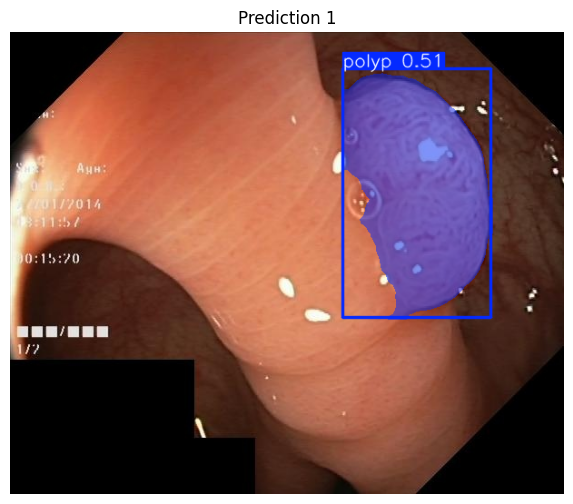

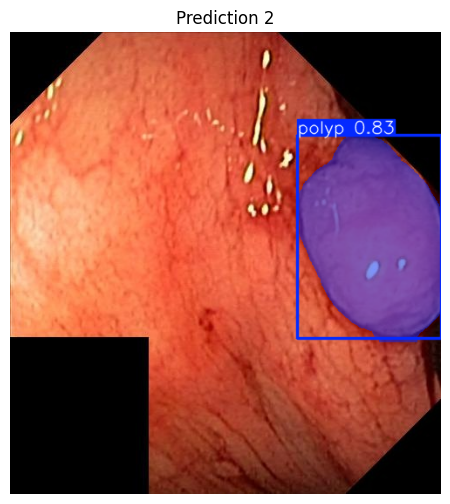

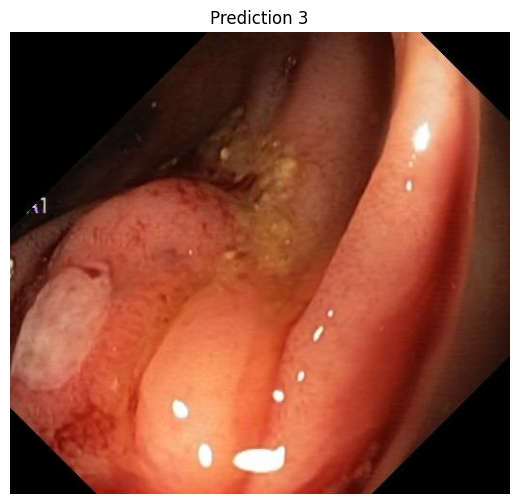

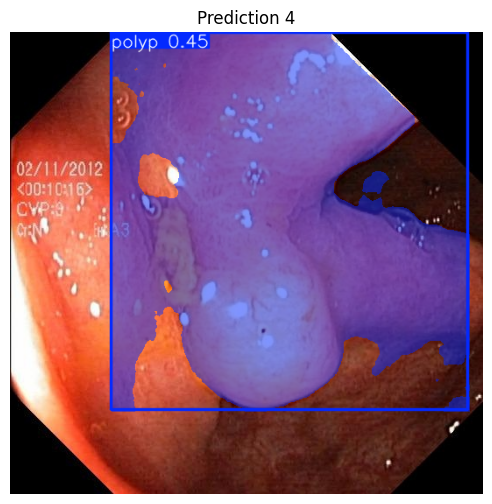

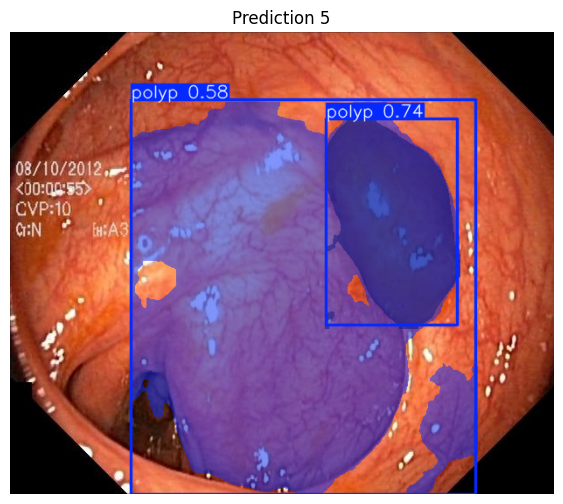

In [11]:
val_imgs = random.sample(glob("dataset/images/val/*.jpg") + glob("dataset/images/val/*.png"), 5)
results = model.predict(val_imgs, conf=0.3)

for i, r in enumerate(results):
    img = r.plot()[:, :, ::-1]
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Prediction {i+1}")
    plt.show()

In [12]:
def calc_iou_dice(pred_mask, gt_mask, thr=0.5):
    pred_bin = (pred_mask > thr).astype(np.uint8)
    gt_bin = (gt_mask > 0.5).astype(np.uint8)
    inter = np.logical_and(pred_bin, gt_bin).sum()
    union = np.logical_or(pred_bin, gt_bin).sum()
    iou = inter / (union + 1e-8)
    dice = 2 * inter / (pred_bin.sum() + gt_mask.sum() + 1e-8)
    return iou, dice

In [13]:
val_imgs = glob("dataset/images/val/*.jpg") + glob("dataset/images/val/*.png")
print(f"Testing {len(val_imgs)} validation images...")

ious, dices, times = [], [], []

for img_path in tqdm(val_imgs, desc="Evaluating YOLOv8"):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Cannot read image: {img_path}")
        continue

    # Inference
    start = time.time()
    results = model.predict(img, conf=0.3, verbose=False)
    times.append(time.time() - start)

    if results[0].masks is None or len(results[0].masks.data) == 0:
        continue

    pred_mask = results[0].masks.data[0].cpu().numpy()
    pred_mask = cv2.resize(pred_mask, (img.shape[1], img.shape[0]))

    # mask ground-truth
    mask_path = None
    img_name = os.path.basename(img_path)
    for ext in [".png", ".jpg", ".jpeg", ".bmp"]:
        candidate = os.path.join(mask_dir, os.path.splitext(img_name)[0] + ext)
        if os.path.exists(candidate):
            mask_path = candidate
            break
    if mask_path is None:
        print(f"Cannot find mask for: {img_name}")
        continue

    mask_gt = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if mask_gt is None:
        print(f"Cannot read mask: {mask_path}")
        continue
    mask_gt = (mask_gt > 127).astype(np.float32)

    i, d = calc_iou_dice(pred_mask, mask_gt)
    ious.append(i)
    dices.append(d)

print(f"\n YOLOv8 Performance:")
print(f"• Mean IoU:  {np.mean(ious):.4f}")
print(f"• Mean Dice: {np.mean(dices):.4f}")
print(f"• Avg inference time: {np.mean(times)*1000:.2f} ms/img")


Testing 100 validation images...


Evaluating YOLOv8: 100%|██████████| 100/100 [00:02<00:00, 37.82it/s]


 YOLOv8 Performance:
• Mean IoU:  0.7903
• Mean Dice: 0.8583
• Avg inference time: 21.98 ms/img


In [15]:
cap = cv2.VideoCapture("video.mp4")

w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

out = cv2.VideoWriter(
    "output.mp4",
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (w, h)
)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model(frame, conf=0.3)[0]

    annotated = results.plot()  # วาด bbox
    out.write(annotated)

cap.release()
out.release()

In [16]:
from IPython.display import Video

Video("video.mp4", embed=True)

In [17]:
!ffmpeg -i /content/output.mp4 -vcodec libx264 -acodec aac /content/output_fixed.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [19]:
Video("output_fixed.mp4", embed=True)